C:\Users\haga\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:375: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
C:\Users\haga\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:376: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
C:\Users\haga\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\haga\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control 

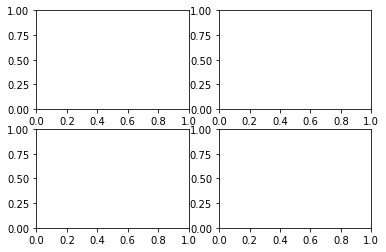

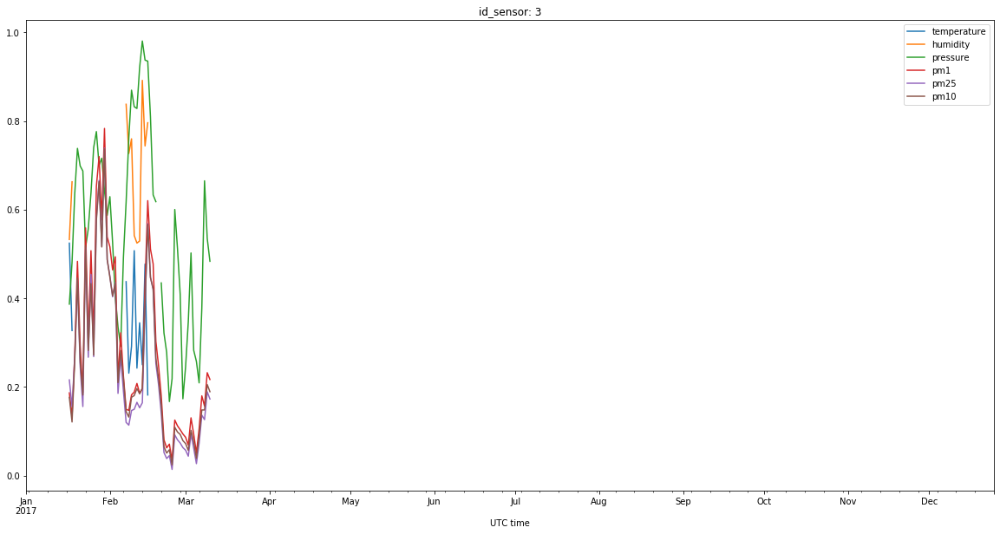

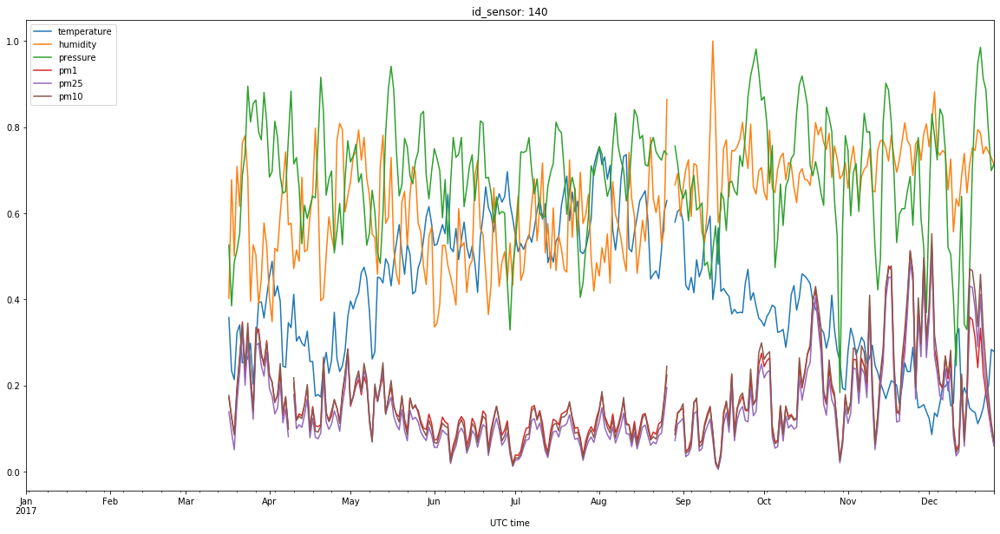

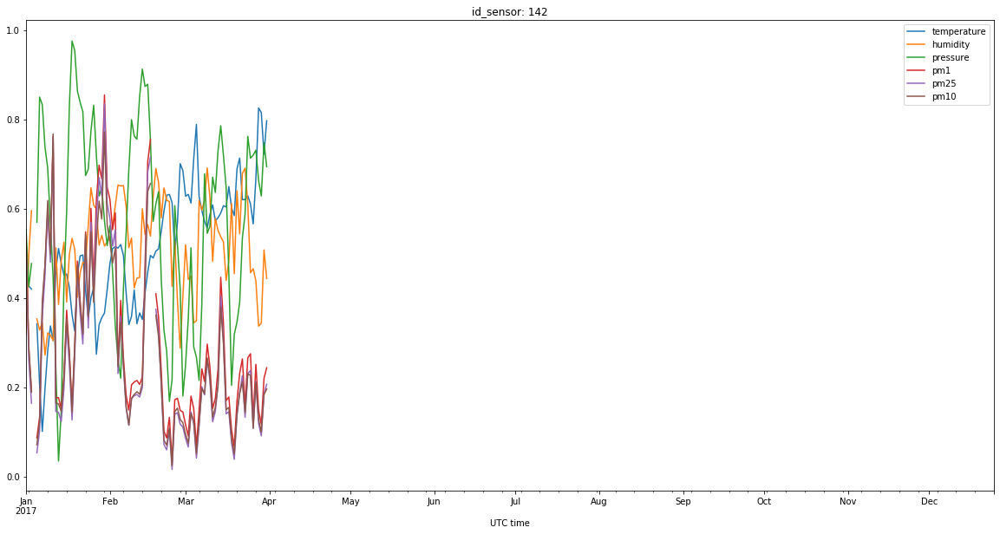

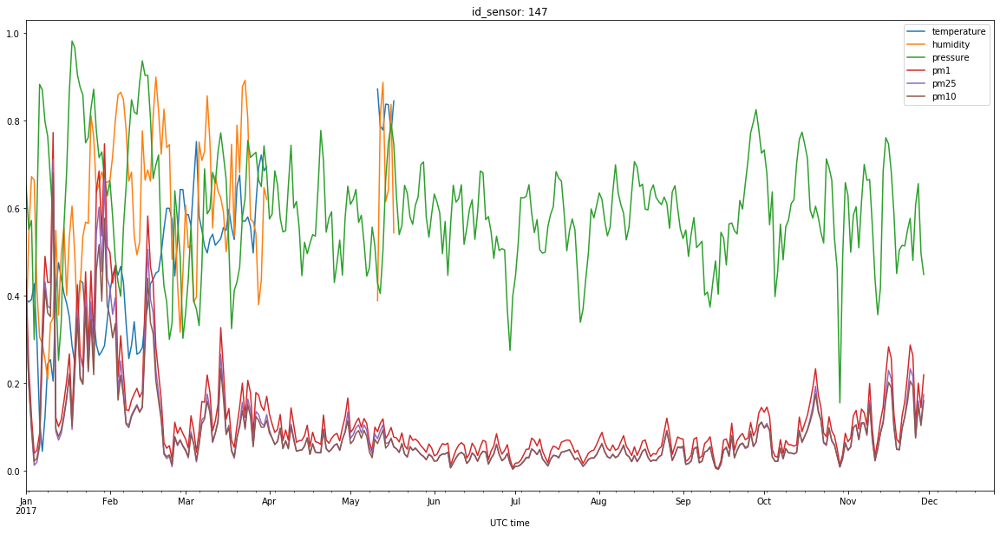

...

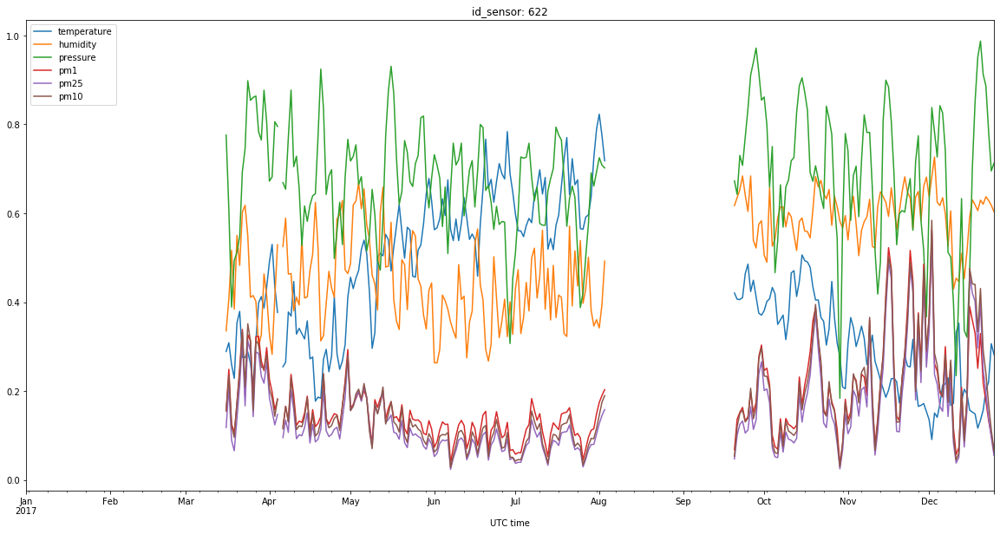

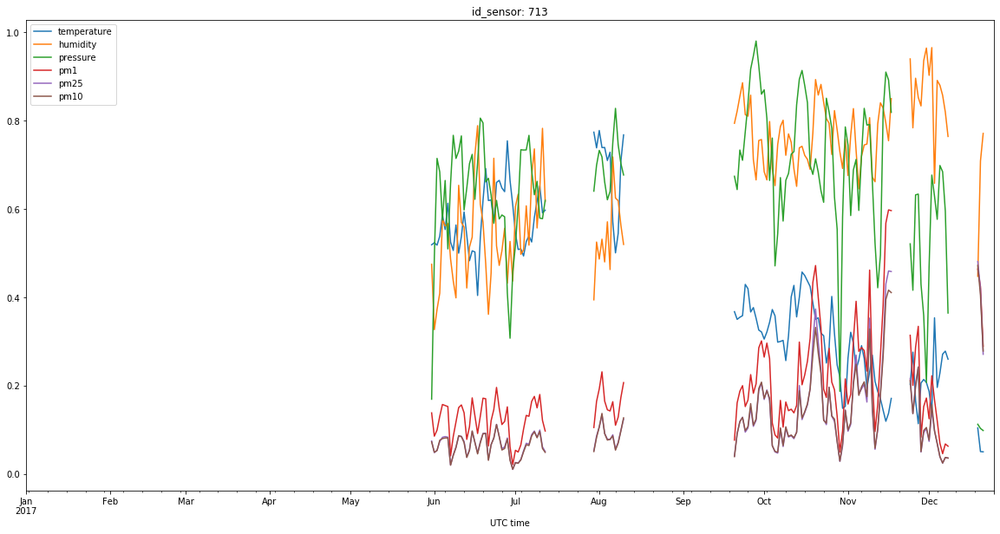

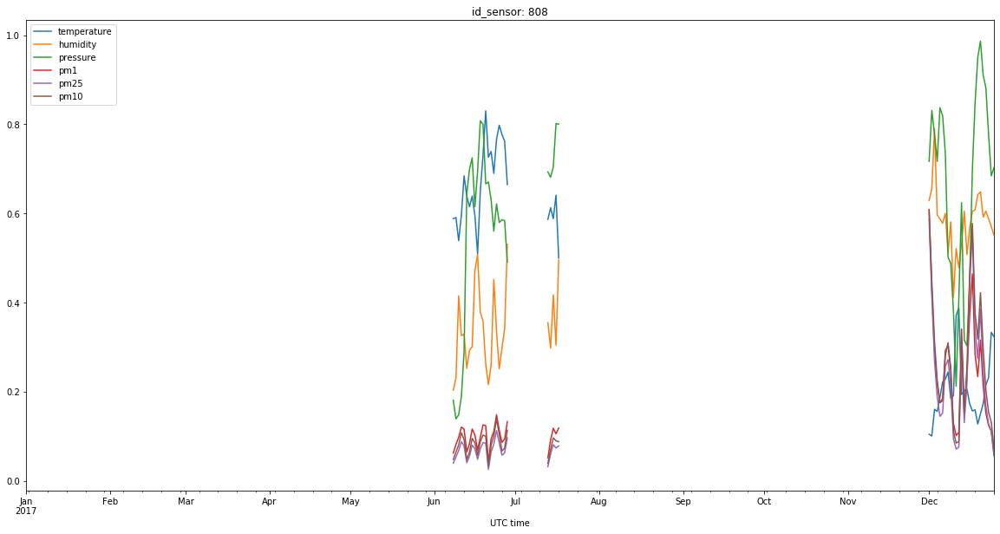

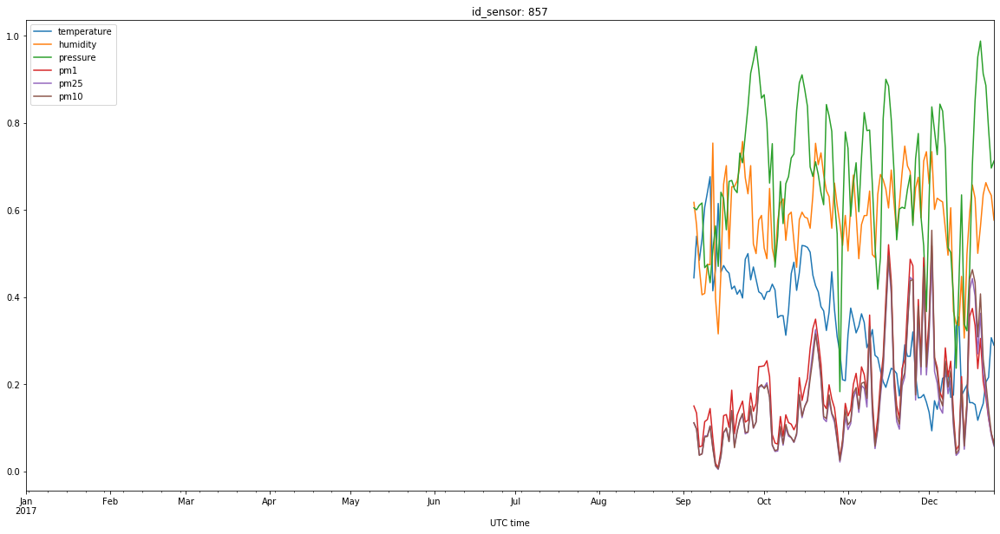

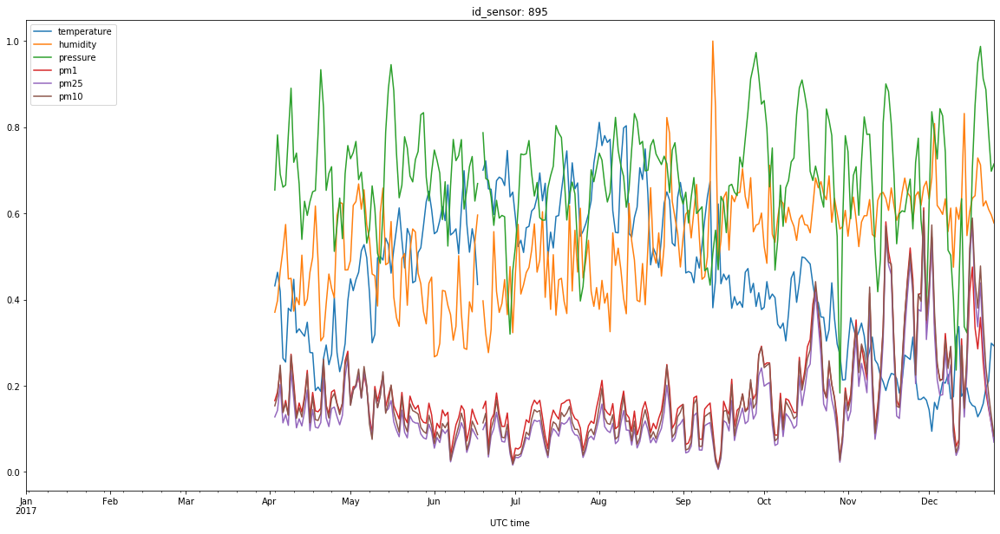

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
df = pd.read_csv("data/full_sensor_data.csv", parse_dates=True, index_col="UTC time")
df_scaled = pd.DataFrame(MinMaxScaler().fit_transform(df), columns=df.columns, index=df.index)
df_scaled.columns = pd.MultiIndex.from_tuples([(c.split('_')[0], c.split('_')[1]) for c in df_scaled.columns])
df_scaled_1D_aggregated = df_scaled.groupby(pd.Grouper(freq='1D')).mean()

fig, axes = plt.subplots(nrows=2, ncols=2)
for id_sensor in df_scaled_1D_aggregated.columns.get_level_values(0).unique().to_list():
    df_scaled_1D_aggregated[id_sensor].plot(figsize=(20, 10), title='id_sensor: ' + id_sensor)